## [pyKNEEr](https://github.com/sbonaretti/pyKNEEr)

# [Segmenting MR Knee Images](https://sbonaretti.github.io/pyKNEEr/segmentation.html)

Segmentation is performed using an atlas-based algorithm. Given a segmented image (reference image), we use registration to segment each image (moving image) of the dataset. 

The segmentation consists of two parts:  
- Segment bone (used to initialize femoral cartilage segmentation)
- Segment cartilage

Each part is composed by 3 steps:  
- Step 1: *Register image to reference*. The moving image is registered to the reference image
- Step 2: *Invert transformation*. Transformations are inverted
- Step 3: *Warp reference mask to moving image*. Inverted transformations are applied to the mask of the reference image to obtain the mask of the moving image  

Registration, inversion, and warping are executed by calling *elastix*[1].

## Import packages

In [1]:
%load_ext autoreload 
%autoreload 2

In [2]:
from pykneer import pykneer_io          as io
from pykneer import segmentation_for_nb as segm

## Image information

Inputs:   
- `input_file_name` contains the list of the images to be segmented  
- `modality` can be "newsubject", "longitudinal", or "multimodal"
- `n_of_cores` is the number of cores used for computations (computations are parallelized for speed)

In [3]:
input_file_name = "./image_list_segmentation_OAI2_FU.txt"
modality        = "longitudinal" # use "newsubject", "longitudinal", or "multimodal" 
n_of_cores      = 10

#### Read image data
- `image_data` is a dictionary (or struct), where each cell corresponds to an image. For each image, information such as paths and file names are stored  

In [4]:
image_data = io.load_image_data_segmentation(modality, input_file_name)

-> image information loaded


## Reference image

The reference image is the number 9 of the current dataset. It was selected as a results of a convergence study described in the paper.
Here we check if femur mask and femur cartilage masks of the reference image are present

In [5]:
segm.prepare_reference(image_data)

001_BL_prep.mha
002_BL_prep.mha
003_BL_prep.mha
004_BL_prep.mha
005_BL_prep.mha
006_BL_prep.mha
007_BL_prep.mha
008_BL_prep.mha
009_BL_prep.mha
010_BL_prep.mha
011_BL_prep.mha
012_BL_prep.mha
013_BL_prep.mha
014_BL_prep.mha
015_BL_prep.mha
016_BL_prep.mha
017_BL_prep.mha
018_BL_prep.mha
019_BL_prep.mha
020_BL_prep.mha
021_BL_prep.mha
022_BL_prep.mha
023_BL_prep.mha
024_BL_prep.mha
025_BL_prep.mha
026_BL_prep.mha
027_BL_prep.mha
028_BL_prep.mha
029_BL_prep.mha
030_BL_prep.mha
031_BL_prep.mha
032_BL_prep.mha
033_BL_prep.mha
034_BL_prep.mha
035_BL_prep.mha
036_BL_prep.mha
037_BL_prep.mha
038_BL_prep.mha
039_BL_prep.mha
040_BL_prep.mha
041_BL_prep.mha
042_BL_prep.mha
043_BL_prep.mha
044_BL_prep.mha
045_BL_prep.mha
046_BL_prep.mha
047_BL_prep.mha
048_BL_prep.mha
049_BL_prep.mha
050_BL_prep.mha
051_BL_prep.mha
052_BL_prep.mha
053_BL_prep.mha
054_BL_prep.mha
055_BL_prep.mha
056_BL_prep.mha
057_BL_prep.mha
058_BL_prep.mha
059_BL_prep.mha
060_BL_prep.mha
061_BL_prep.mha
062_BL_prep.mha
063_BL_p

## Segment bone

#### 1. Register image to reference

In [6]:
segm.register_bone_to_reference(image_data, n_of_cores)

-> Registration completed
-> The total time was 2625.26 seconds (about 43 min)


#### 2. Invert transformations

In [7]:
segm.invert_bone_transformations(image_data, n_of_cores)

-> Inversion completed
-> The total time was 1358.07 seconds (about 22 min)


#### 3. Warp reference mask to moving image

In [8]:
segm.warp_bone_mask(image_data, n_of_cores)

-> Warping completed
-> The total time was 870.72 seconds (about 14 min)


## Segment cartilage

#### 1. Register image to reference

In [9]:
segm.register_cartilage_to_reference(image_data, n_of_cores)

-> Registration completed
-> The total time was 2002.26 seconds (about 33 min)


#### 2. Invert transformations

In [10]:
segm.invert_cartilage_transformations(image_data, n_of_cores)

-> Inversion completed
-> The total time was 1148.93 seconds (about 19 min)


#### 3. Warp reference mask to moving image (optional)

In [11]:
segm.warp_cartilage_mask(image_data, n_of_cores)

-> Warping completed
-> The total time was 876.21 seconds (about 14 min)


## Visualize segmentations
Visual check of the results. For each image (row), segmentation at medial, central, and lateral compartments

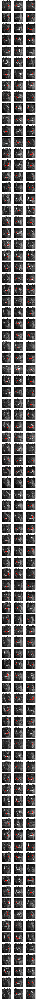

In [12]:
segm.show_segmented_images(image_data)

### References

[1] Klein S., Staring M., Murphy K., Viergever M.A., Pluim J.P.W. [*elastix: A Toolbox for Intensity-Based Medical Image Registration*](http://elastix.isi.uu.nl/marius/downloads/2010_j_TMI.pdf) IEEE Transactions on Medical Imaging. vol. 29, no. 1, pp. 196 - 205, January. 2010. 

### Dependencies

In [13]:
%load_ext watermark
print ("elastix 4.8.0\n")
%watermark -v -m -p SimpleITK,numpy,matplotlib,multiprocessing

elastix 4.8.0

CPython 3.6.1
IPython 6.4.0

SimpleITK unknown
numpy 1.14.5
matplotlib 2.2.2
multiprocessing unknown

compiler   : GCC 4.8.5 20150623 (Red Hat 4.8.5-11)
system     : Linux
release    : 3.10.0-862.14.4.el7.x86_64
machine    : x86_64
processor  : x86_64
CPU cores  : 20
interpreter: 64bit
